In [113]:
%matplotlib widget


In [ ]:
import numpy as np
import gradio as gr
import matplotlib.pyplot as plt
#from scipy.io import savemat
import time
import trimesh
from trimesh.transformations import rotation_matrix
import mplcursors

# Importar funciones necesarias
from create_object import create_object  # Si ya no es necesario, puedes omitir esto
from compute_normal import compute_normal  # Si ya no es necesario, puedes omitir esto
from plane_line_intersect import plane_line_intersect  # Posiblemente no necesario con trimesh
from noise import add_sensor_noise, add_environmental_noise, add_shot_noise
#from plot_scene_dual_training_selfOcc_2 import plot_scene_dual_training_selfOcc_2
plt.close('all') 

In [115]:
# SPAD Camera Params
camera_FOV = 0.25
camera_FOV_center = [0, -camera_FOV / 2, 0]
cam_pixel_dim = 32
bin_size = 390e-12
c = 299792458
FOV_radius = camera_FOV / cam_pixel_dim  

# Laser params
laser_intensity = 1000
laser_pos = np.array([0, 0, 0])
laser_normal = np.array([0, 0, 1])

# Simulation parameters
wall_discr = c / 2 * bin_size / 4

# Room Dimensions (in meters)
xmin, xmax = -3/2, 3/2
ymin, ymax = 0, 3
zmin, zmax = 0, 3

params = {
    'cam_pixel_dim': cam_pixel_dim,
    'camera_FOV': camera_FOV,
    'camera_FOV_center': camera_FOV_center,
    'FOV_radius': FOV_radius,
    'laser_intensity': laser_intensity,
    'bin_size': bin_size,
    'c': c,
    'laser_pos': laser_pos,
    'laser_normal': laser_normal,
    'wall_discr': wall_discr,
}

# Define colors for the scene elements
wall_color = [200, 200, 255, 255]  # Light blue
object_color = [240, 178, 122, 255]  # Light pink
laser_color = [255, 0, 0, 255]  # Red
camera_pixel_color = [0, 255, 0, 255]  # Green
front_wall_color = [200, 200, 200, 100]  



furthest_scene_point = np.array([xmax, ymax, zmax])
furthest_spad_point = np.array([-params['camera_FOV'] / 2, -params['camera_FOV'], 0])
d1 = np.linalg.norm(furthest_scene_point - laser_pos)
d2 = np.linalg.norm(furthest_spad_point - furthest_scene_point)
max_dist_travel = d1 + d2
num_time_bins = int(np.ceil((max_dist_travel / c / bin_size + 0.2 * max_dist_travel / c / bin_size)))
params['num_time_bins'] = num_time_bins

In [116]:
import trimesh

# Crear una pared como malla
def create_wall_mesh(origin, u_vec, v_vec, color):
    # Calcular el ancho y alto de la pared
    width = np.linalg.norm(u_vec)
    height = np.linalg.norm(v_vec)
    
    # Crear una caja delgada como pared
    wall = trimesh.creation.box(extents=(width, 0.01, height))  # Grosor de 0.01 en el eje Y
    wall.visual.vertex_colors = color

    
    # Calcular la rotación necesaria para alinear la pared
    normal = np.cross(u_vec, v_vec)
    normal = normal / np.linalg.norm(normal)
    y_axis = np.array([0, 1, 0])  # Eje Y, ya que la pared se creó en XZ plane
    rotation_axis = np.cross(y_axis, normal)
    rotation_angle = np.arccos(np.clip(np.dot(y_axis, normal), -1.0, 1.0))
    if np.linalg.norm(rotation_axis) > 0:
        rotation_axis = rotation_axis / np.linalg.norm(rotation_axis)
        rotation_matrix = trimesh.transformations.rotation_matrix(rotation_angle, rotation_axis)
        wall.apply_transform(rotation_matrix)
    
    # Posicionar la pared en la escena
    wall.apply_translation(origin + 0.5 * (u_vec + v_vec))
    return wall



In [117]:
# Crear paredes y techo como mallas
back_wall = create_wall_mesh(np.array([xmin, ymax, 0]), np.array([xmax - xmin, 0, 0]), np.array([0, 0, zmax]), wall_color)
right_wall = create_wall_mesh(np.array([xmax, ymax, 0]), np.array([0, -ymax, 0]), np.array([0, 0, zmax]), wall_color)
left_wall = create_wall_mesh(np.array([xmin, ymax, 0]), np.array([0, -ymax, 0]), np.array([0, 0, zmax]), wall_color)
ceiling = create_wall_mesh(np.array([xmin, ymax, zmax]), np.array([xmax - xmin, 0, 0]), np.array([0, -ymax, 0]), wall_color)

# Lista de objetos
objects = [back_wall, right_wall, left_wall, ceiling]

# Agregar la faceta plana
w = 0.2  # Ancho
h = 1.1 # Altura
xcoord = [0.5]
ycoord = [0.25]

for xx in range(len(xcoord)):
    v1 = np.array([xcoord[xx], ycoord[xx], 0])
    u = np.array([1, 0, 0])
    #v_dir = v1 - np.array([0, 0, 0])
    #cos_theta = np.dot(u, v_dir) / (np.linalg.norm(u) * np.linalg.norm(v_dir))
    #cos_theta = np.clip(cos_theta, -1, 1)
    theta = -np.clip(np.dot(u, v1) / (np.linalg.norm(u) * np.linalg.norm(v1)), -1, 1)

    #theta_rad = -np.arccos(cos_theta)
    
    obj = trimesh.load('/home/cristianr/NLOS-Simulator/objects/dummy.obj', force='mesh')
    obj_extents = obj.extents
    scale_factors = [w / obj_extents[0], h / obj_extents[2]]
    scale_factor = min(scale_factors) * 5
    obj.apply_scale(scale_factor)
    rotation = rotation_matrix(np.radians(90), [1, 0, 0])
    obj.apply_transform(rotation)
    rotation_z = rotation_matrix(theta, [0, 0, 1])
    z_min = obj.vertices[:, 2].min()
    obj.apply_transform(rotation_z)
    obj.apply_translation([0,0, -z_min])
    obj.apply_translation(v1)
    obj.visual.vertex_colors = object_color
    
    # Code for planar facet
    """ plane = trimesh.creation.box(extents=(w, 0.01, h))
    rotation = rotation_matrix(theta, [0, 0, 1])
    plane.apply_transform(rotation)
    plane.apply_translation([0, 0, h / 2])
    plane.apply_translation(v1) """


    objects.append(obj)

In [118]:

# Crear una escena y agregar todas las mallas
scene = trimesh.Scene(objects)
    
# Agregar la posición del láser
laser_sphere = trimesh.creation.icosphere(radius=0.03)
laser_sphere.apply_translation(laser_pos)
laser_sphere.visual.vertex_colors = laser_color
scene.add_geometry(laser_sphere)
    
# Agregar los píxeles de la cámara
cam_pixel_dim = params['cam_pixel_dim']
pixel_x = np.linspace(
    params['camera_FOV_center'][0] - params['camera_FOV'] / 2 + params['camera_FOV'] / (2 * cam_pixel_dim),
    params['camera_FOV_center'][0] + params['camera_FOV'] / 2 - params['camera_FOV'] / (2 * cam_pixel_dim),
    cam_pixel_dim
)
pixel_y = np.linspace(
    params['camera_FOV_center'][1] - params['camera_FOV'] / 2 + params['camera_FOV'] / (2 * cam_pixel_dim),
    params['camera_FOV_center'][1] + params['camera_FOV'] / 2 - params['camera_FOV'] / (2 * cam_pixel_dim),
    cam_pixel_dim
)

pixel_t = np.linspace(0, (params['num_time_bins'] - 1) * params['bin_size'], params['num_time_bins'])

X, Y = np.meshgrid(pixel_x, pixel_y)
cam_pos = np.vstack([X.ravel(), Y.ravel(), np.zeros(cam_pixel_dim**2)]).T

X_ind, Y_ind = np.meshgrid(range(params['cam_pixel_dim']), range(params['cam_pixel_dim']), indexing='xy')
cam_pos_ind = np.vstack([X_ind.ravel(), Y_ind.ravel()]).T

X, Y, T = np.meshgrid(pixel_x, pixel_y, pixel_t)
cam_pixel = np.vstack([X.ravel(), Y.ravel(), T.ravel()]).T

camera_pixels = trimesh.points.PointCloud(cam_pos, colors=camera_pixel_color)

scene.add_geometry(camera_pixels)

sphere_radius = 0.02  
camera_pixel = []
rotation = rotation_matrix(np.radians(90), [1, 0, 0])
for pos in cam_pos:
    sphere = trimesh.creation.icosphere(radius=sphere_radius)
    sphere.apply_translation(pos)
    sphere.front_wall_color = [200, 200, 200, 100]  
    sphere.visual.vertex_colors = camera_pixel_color
    camera_pixel.append(sphere)
    
# Agregar todas las esferas a la escena
scene.add_geometry(camera_pixel)

# Define the wall dimensions and position
x_start = 0          # Start at x = 0
x_end = xmax         # End at x = xmax
y_pos = ymin         # The wall is at the front (minimum y)
z_start = zmin       # Start at z = zmin
z_end = zmax         # End at z = zmax

# Define grid resolution (adjust as needed for density)
x_steps = 20         # Number of points along x-axis
z_steps = 20         # Number of points along z-axis

# Create a grid of points
x_coords = np.linspace(x_start, x_end, x_steps)
z_coords = np.linspace(z_start, z_end, z_steps)
X_grid, Z_grid = np.meshgrid(x_coords, z_coords)
Y_grid = np.full_like(X_grid, y_pos)  # All y coordinates are at y_pos

# Flatten the grids to create a list of point coordinates
wall_points = np.vstack((X_grid.flatten(), Y_grid.flatten(), Z_grid.flatten())).T

# Create small spheres at each point
sphere_radius = 0.02  # Adjust the radius as needed
wall_spheres = []

for pos in wall_points:
    sphere = trimesh.creation.icosphere(subdivisions=1, radius=sphere_radius)
    sphere.apply_translation(pos)
    sphere.visual.vertex_colors = [200, 200, 200, 255]  # Color of the spheres
    wall_spheres.append(sphere)

# Add the spheres representing the wall to the scene
scene.add_geometry(wall_spheres)

# Visualizar la escena
scene.show()

In [119]:
# Combinar las mallas y crear el intersector de rayos
combined_mesh = trimesh.util.concatenate(objects)
try:
    ray_intersector = trimesh.ray.ray_pyembree.RayMeshIntersector(combined_mesh)
except ImportError:
    ray_intersector = trimesh.ray.ray_triangle.RayMeshIntersector(combined_mesh)

# Obtener triángulos y normales
triangles = combined_mesh.triangles
triangle_normals = combined_mesh.face_normals
num_triangles = len(triangles)

# Inicializar el vector de mediciones
num_pixels = params['cam_pixel_dim'] ** 2
num_bins = params['num_time_bins']

# Crear el vector de medición
y_meas_vec = np.zeros(cam_pixel.shape[0])

fourpi = 4 * np.pi * np.pi
floor_normal = np.array([0, 0, 1])
floor_pixel_width = params['camera_FOV'] / params['cam_pixel_dim']


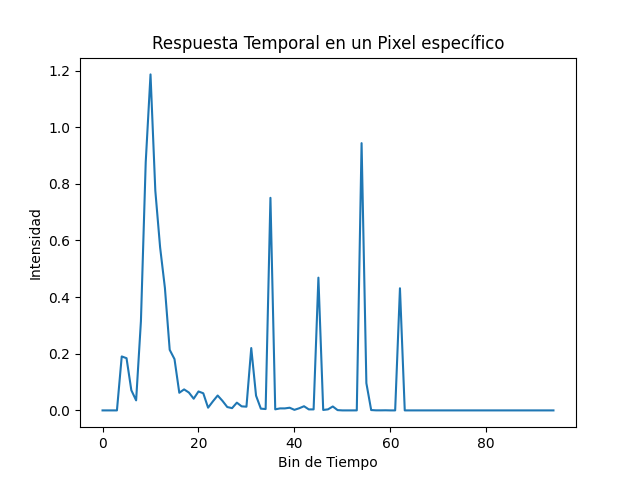

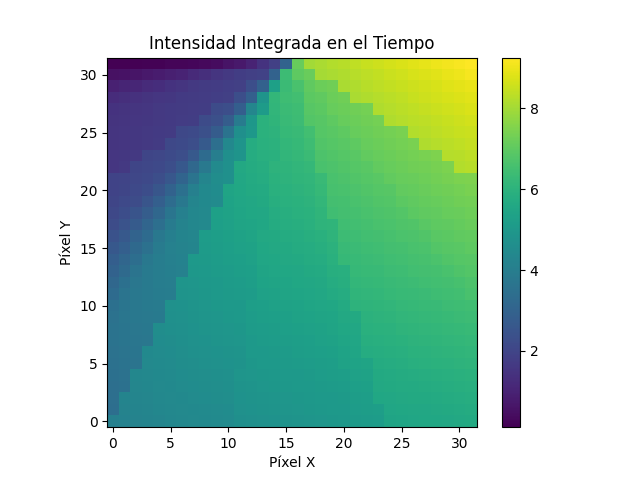

In [120]:
# Iterar sobre cada triángulo de la malla (equivalente a scene_pixel en el código original)
for idx in range(len(triangles)):
    # Obtener el triángulo y su normal
    triangle = triangles[idx]
    normal = triangle_normals[idx]
    area = 0.5 * np.linalg.norm(np.cross(triangle[1] - triangle[0], triangle[2] - triangle[0]))
    scene_center = triangle.mean(axis=0)

    m = (scene_center[1] - cam_pos[:, 1]) / (scene_center[0] - cam_pos[:, 0]) 
    b = scene_center[1] - np.dot(m, scene_center[0])
    
    xint = -b / m
    
    noc = xint > 0
    if np.sum(noc) > 0:
        lps = params['laser_pos'] - scene_center
        fovsp = cam_pos[noc, :] - scene_center

        d1s = np.sum(lps**2)
        d2s = np.sum(fovsp**2, axis=1)
        d1 = np.sqrt(d1s)
        d2 = np.sqrt(d2s)
        distance = d1 + d2
        tbin = distance / (c * params['bin_size'])
        arrival_bin = np.ceil(tbin).astype(int)

        dot1 = np.maximum(0, np.sum(np.dot(normal, lps / d1))) 
        dot2 = np.maximum(0, np.sum(normal * fovsp / d2[:, np.newaxis], axis=1))            
        dot3 = np.maximum(0, np.sum(np.dot(params['laser_normal'], -lps / d1)))  
        dot4 = np.maximum(0, np.sum(floor_normal * -fovsp / d2[:, np.newaxis], axis=1))

        intensity = params['laser_intensity'] * area * (dot1 * dot2 * dot3 * dot4) / (fourpi * d1s * d2s)

        coord = np.dot(arrival_bin - 1, params['cam_pixel_dim']**2) + np.dot((cam_pos_ind[noc, 0] - 1), params['cam_pixel_dim']) + cam_pos_ind[noc, 1]
        
        y_meas_vec[coord] += intensity
        
# Reshape para visualización
y_meas_vec = y_meas_vec.reshape((params['cam_pixel_dim'], params['cam_pixel_dim'], num_bins), order='F')

# Añadir ruido de sensor
y_meas_vec_noisy = add_sensor_noise(y_meas_vec, laser_intensity=laser_intensity)

# Añadir ruido ambiental
y_meas_vec_noisy = add_environmental_noise(y_meas_vec_noisy)

# Añadir ruido de disparo (shot noise)
y_meas_vec_noisy = add_shot_noise(y_meas_vec_noisy) 

# Visualizar la respuesta temporal de un píxel de muestra
plt.figure()
plt.plot(y_meas_vec[31, 23, :])
plt.title('Respuesta Temporal en un Pixel específico')
plt.xlabel('Bin de Tiempo')
plt.ylabel('Intensidad')
plt.show()

# Sumar sobre los bins de tiempo para obtener una imagen 2D
y_sum = np.sum(y_meas_vec, axis=2)
y_sum = np.roll(y_sum, shift=1, axis=-1)

# Visualizar la imagen 2D
fig, ax = plt.subplots()
cax = ax.imshow(y_sum, cmap='viridis')
plt.colorbar(cax)
plt.title('Intensidad Integrada en el Tiempo')
plt.gca().invert_yaxis()
plt.xlabel('Píxel X')
plt.ylabel('Píxel Y')

# Crear un cursor interactivo
cursor = mplcursors.cursor(cax, hover=True)

@cursor.connect("add")
def on_add(sel):
    # Obtener las coordenadas del clic en píxeles (float)
    x_float, y_float = sel.target[0], sel.target[1]
    
    # Convertir las coordenadas a enteros (redondear al entero más cercano)
    x, y = int(round(x_float)), int(round(y_float))
    
    # Asegurarse de que las coordenadas estén dentro de los límites de la matriz
    x = np.clip(x, 0, y_sum.shape[1] - 1)
    y = np.clip(y, 0, y_sum.shape[0] - 1)
    
    # Obtener la intensidad en la posición (y, x)
    intensity = y_sum[y, x]
    
    # Establecer el texto de la anotación
    sel.annotation.set_text(f"X: {x}, Y: {y}\nIntensidad: {intensity:.2f}")

plt.show()

# Guardar los datos
filename = f"Simulacion_Con_Malla_{int(params['bin_size'] * 1e12)}ps.mat"
# savemat(filename, {'params': params, 'y_meas_vec': y_meas_vec_noisy, 'objects': objects})


In [121]:
#error = y_meas_vec_1 - y_meas_vec_2
y_meas_vec.mean()

np.float64(0.055228954850831916)

In [122]:
len(objects)

5